In [2]:
import os

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import TwoPUtils
import STX3KO_analyses as stx



%matplotlib inline

%load_ext autoreload
%autoreload 2

{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 14, 'novel': 1}
{'date': '29_11_2020', 'scene': 'YMaze_LNovel', 'session': 2, 'scan': 18, 'novel': 1}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': 1}
{'date': '30_11_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 9, 'novel': 1}
{'date': '01_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': 1}
{'date': '02_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': 1}
{'date': '03_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1}
{'date': '04_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1}
{'date': '06_12_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1}
{'date': '06_12_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 6, 'novel': 1}
{'date': '06_12_2020', 'scene': 'YMaze_RewardReversal', 'session': 2, 'scan': 2, 'novel': 1}
{'date': '07_12_2020', 'scene': 'YMaze_RewardRe

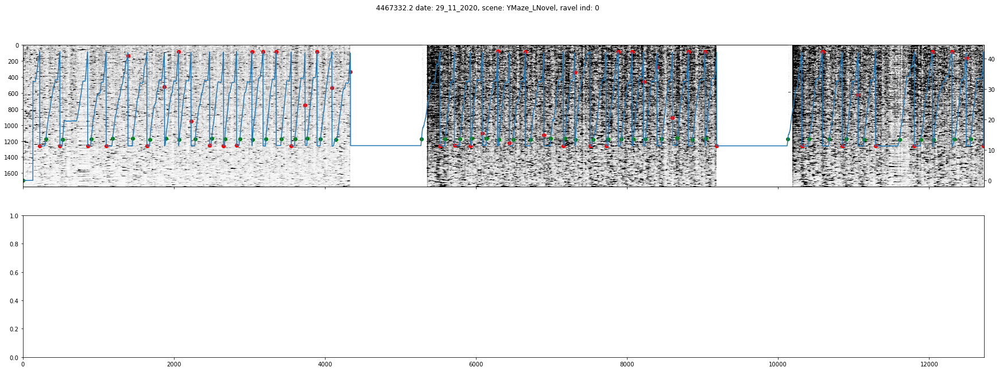

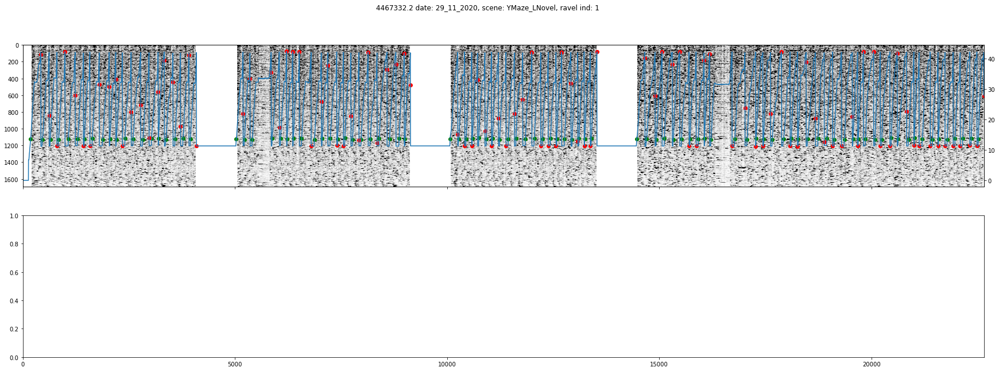

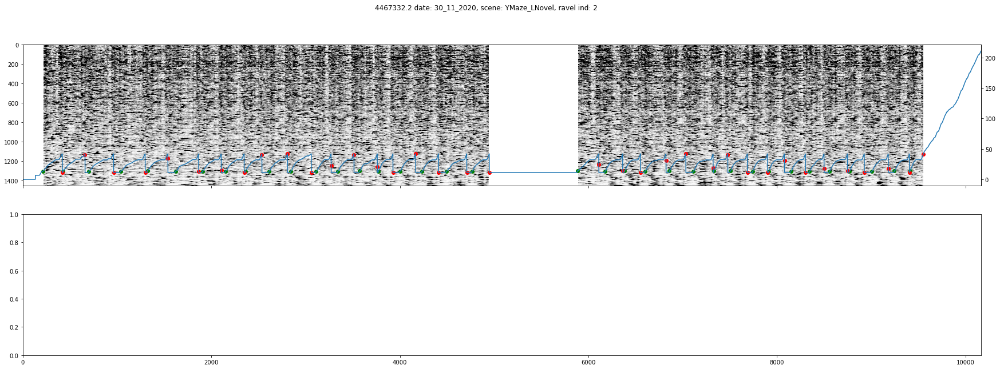

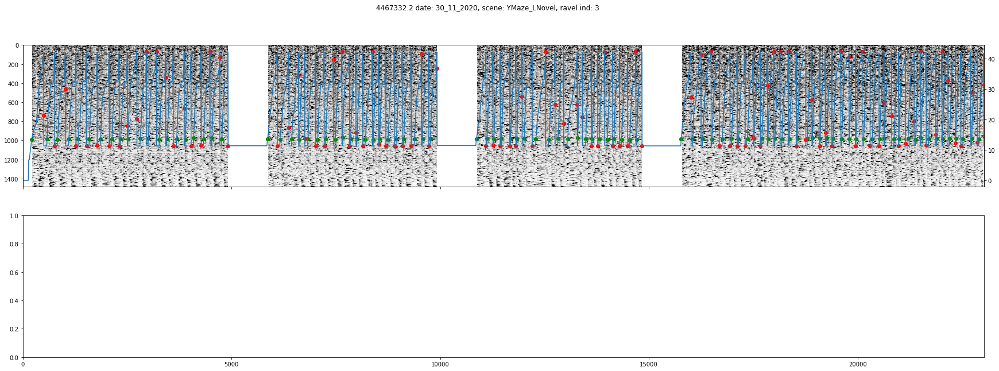

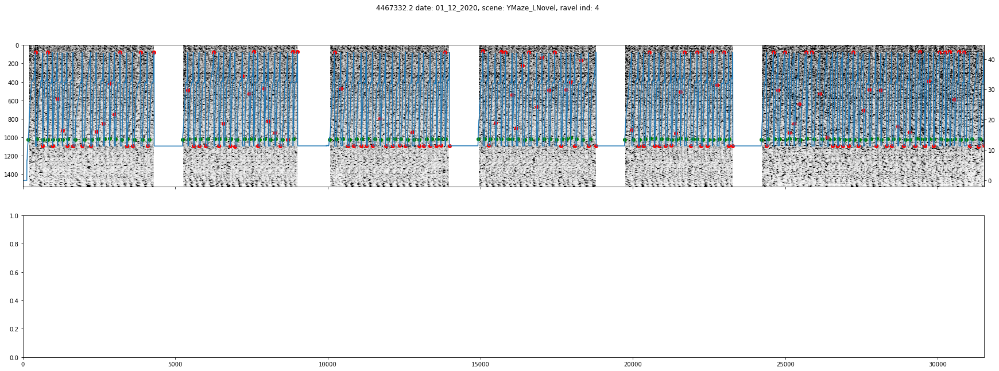

...

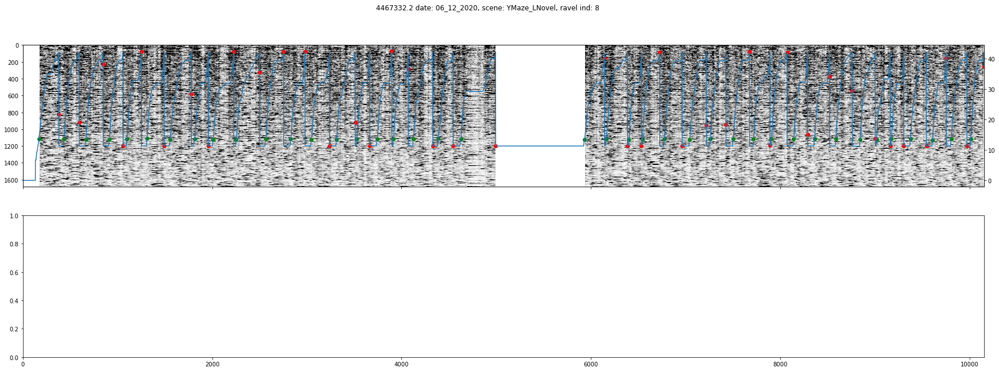

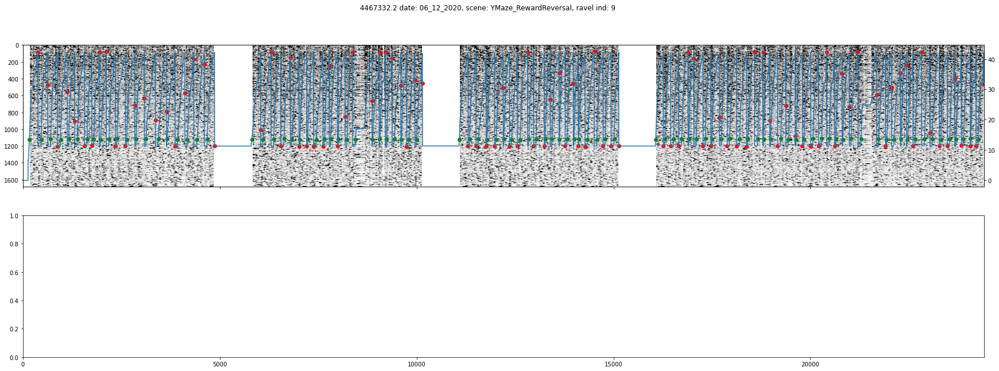

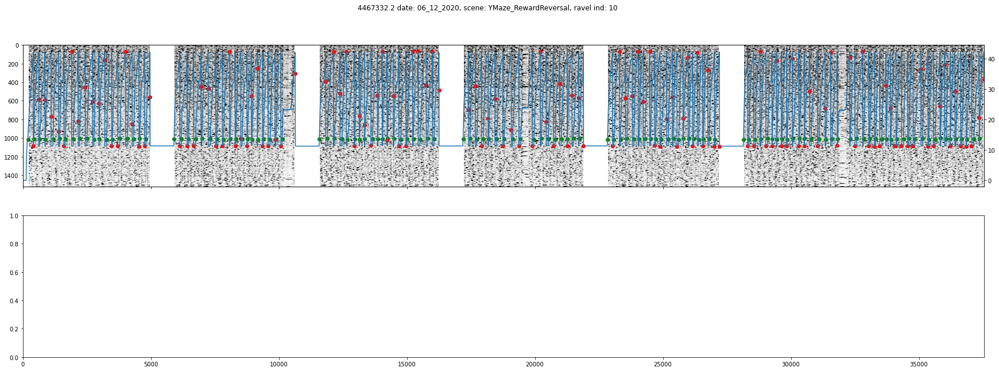

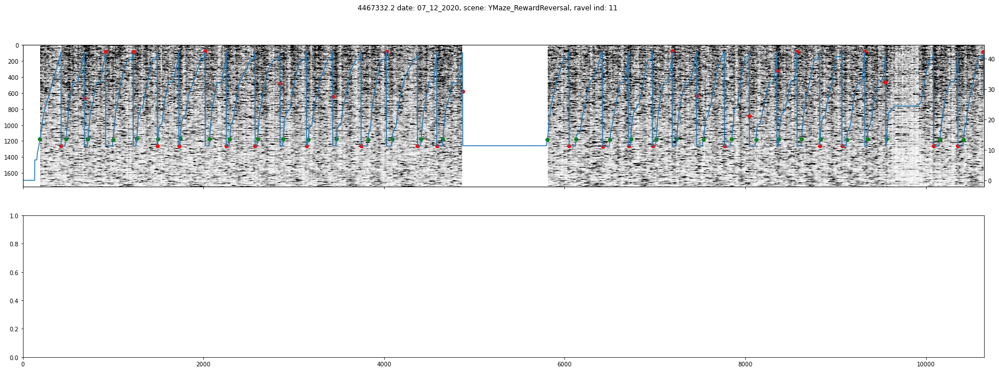

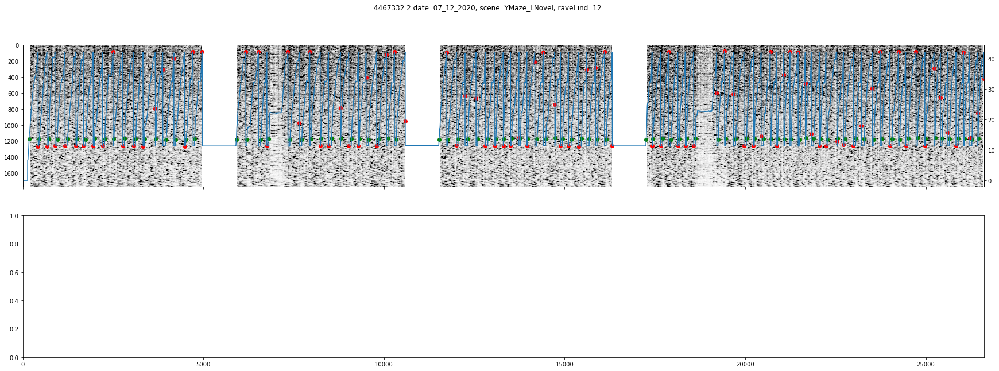

In [31]:
# for mouse, sessions in stx.ymaze_sess_deets.KO_sessions_ravel.items():
mouse = '4467332.2'
# sessions = stx.ymaze_sess_deets.KO_sessions_ravel[mouse]
sessions = stx.ymaze_sess_deets.CTRL_sessions_ravel[mouse]
pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)
for ind, deets in enumerate(sessions):
    print(deets)
        
        
    sess = stx.session.YMazeSession.from_file(
                            os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                            verbose=False)

    fig,ax =  plt.subplots(2,1,figsize=[30,10], sharex=True)
   
    
    axx = ax[0].twinx()
    ax[0].imshow(sess.timeseries['F_dff_norm'][::-1,:],aspect = 'auto',vmin=0,vmax=.3,cmap='Greys',zorder=10)
    
    axx.plot(sess.vr_data['t']._values)
    axx.scatter(sess.trial_start_inds,sess.vr_data['t'].iloc[sess.trial_start_inds],color='green')
    axx.scatter(sess.teleport_inds,sess.vr_data['t'].iloc[sess.teleport_inds],color='red')
#         ax[0].plot(sess.timeseries['F_dff'][2,:])


#     ax[1].imshow(sess.timeseries['F_dff_norm'],aspect = 'auto',vmin=0,vmax=.3)
    fig.suptitle("%s date: %s, scene: %s, ravel ind: %d" % (mouse, deets['date'], deets['scene'], ind))